## Sistema de Recomendación


Análsis Bases de Datos 

In [2]:
# Librerías

import numpy as np
import pandas as pd
import sklearn 
import matplotlib.pyplot as plt
import seaborn as sns 

# Hotel_Reviews_EU

[515K Hotel Reviews Data in Europe](https://www.kaggle.com/datasets/jiashenliu/515k-hotel-reviews-data-in-europe)

In [3]:
hotel_reviews_eu = pd.read_csv("DataBases/Hotel_Reviews_EU.csv/Hotel_Reviews.csv")
hotel_reviews_eu.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


La información está condensada en una sola tabla. Además, no se tiene información individal por usuario sino que todas las reseñas están según las nacionalidades. Sólo se conoce de los usuarios el número de reseñas que dieron, pero éstas estarían bajo la nacionalidad, no tienen un id.

## HOTELES

In [125]:
hotel_reviews_eu.reset_index()
hotel_info_eu = hotel_reviews_eu[['Hotel_Name', 'Hotel_Address']].drop_duplicates(keep='first', ignore_index=True)
hotel_info_eu.insert(0, 'hotel_id', range(0, len(hotel_info_eu)))
hotel_info_eu.insert(1, 'hotel_country', hotel_info_eu['Hotel_Address'].str.split().str[-1])

hotel_info_eu.loc[hotel_info_eu['hotel_country'] == 'Kingdom', ['hotel_country']] = 'United Kingdom'

print(f"Total de Hoteles: {len(hotel_info_eu)}")
hotel_info_eu.head()

Total de Hoteles: 1494


,hotel_id,hotel_country,Hotel_Name,Hotel_Address
0,0,Netherlands,Hotel Arena,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
1,1,United Kingdom,K K Hotel George,1 15 Templeton Place Earl s Court Kensington a...
2,2,United Kingdom,Apex Temple Court Hotel,1 2 Serjeant s Inn Fleet Street City of London...
3,3,United Kingdom,The Park Grand London Paddington,1 3 Queens Garden Westminster Borough London W...
4,4,France,Monhotel Lounge SPA,1 3 Rue d Argentine 16th arr 75116 Paris France


In [159]:
#hotel_info_eu.to_csv('hotel_info_eu.csv')

In [126]:
from collections import Counter

contador_paises = Counter(pais for pais in hotel_info_eu['hotel_country'])
print(f"Existen {len(contador_paises)} países en el dataset.")
contador_paises

Existen 6 países en el dataset.


Counter({'Netherlands': 105,
         'United Kingdom': 400,
         'France': 458,
         'Spain': 211,
         'Italy': 162,
         'Austria': 158})

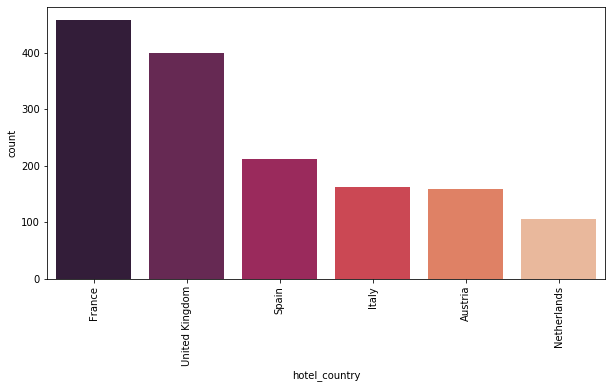

In [127]:
paises_counts_df = pd.DataFrame([contador_paises]).T.reset_index()
paises_counts_df.columns = ['hotel_country', 'count']
paises_counts_df = paises_counts_df.sort_values(by='count', ascending=False)

plt.figure(figsize=(10, 5))
sns.barplot(x='hotel_country', y='count', data=paises_counts_df, palette='rocket')
plt.xticks(rotation=90)
plt.show()

In [128]:
paises_counts_df.head()

,hotel_country,count
2,France,458
1,United Kingdom,400
3,Spain,211
4,Italy,162
5,Austria,158


Hay 6 países en el dataset, con 1494 hoteles distribuidos en la siguiente manera:
| País | Hoteles |
|------|---------|
| France | 458 |
| United Kingdom | 400 |
| Spain | 211 |
| Italy | 162 |
| Austria | 158 |
| Netherlands | 105 |

Siendo `Francia` el país más visitado seguido por `United Kingdom`.


## RESEÑAS

In [129]:
review_info_eu = hotel_reviews_eu[['Hotel_Address', 'Reviewer_Nationality', 'Negative_Review', 'Positive_Review', 
                            'Reviewer_Score', 'Review_Date', 'Total_Number_of_Reviews_Reviewer_Has_Given']]
# dictionary
hotel_dict = {row.Hotel_Address : row.hotel_id for (index, row) in hotel_info_eu.iterrows()}
review_info_eu = review_info_eu.replace({"Hotel_Address": hotel_dict})

review_info_eu.columns = review_info_eu.columns.str.replace('Hotel_Address', 'hotel_id')

In [130]:
review_info_eu.head()

,hotel_id,Reviewer_Nationality,Negative_Review,Positive_Review,Reviewer_Score,Review_Date,Total_Number_of_Reviews_Reviewer_Has_Given
0,0,Russia,I am so angry that i made this post available...,Only the park outside of the hotel was beauti...,2.9,8/3/2017,7
1,0,Ireland,No Negative,No real complaints the hotel was great great ...,7.5,8/3/2017,7
2,0,Australia,Rooms are nice but for elderly a bit difficul...,Location was good and staff were ok It is cut...,7.1,7/31/2017,9
3,0,United Kingdom,My room was dirty and I was afraid to walk ba...,Great location in nice surroundings the bar a...,3.8,7/31/2017,1
4,0,New Zealand,You When I booked with your company on line y...,Amazing location and building Romantic setting,6.7,7/24/2017,3


In [131]:
contador_nacionalidades = Counter(pais for pais in review_info_eu['Reviewer_Nationality'])
print(f"Existen {len(contador_nacionalidades)} nacionalidades en el dataset.")
#contador_nacionalidades

Existen 227 nacionalidades en el dataset.


In [132]:
# type(contador_nacionalidades) >> collections.Counter
mas_comunes = contador_nacionalidades.most_common(20)
for item, conta in mas_comunes:
    print(f'{item}:{conta}')

 United Kingdom :245246
 United States of America :35437
 Australia :21686
 Ireland :14827
 United Arab Emirates :10235
 Saudi Arabia :8951
 Netherlands :8772
 Switzerland :8678
 Germany :7941
 Canada :7894
 France :7296
 Israel :6610
 Italy :6114
 Belgium :6031
 Turkey :5444
 Kuwait :4920
 Spain :4737
 Romania :4552
 Russia :3900
 South Africa :3821


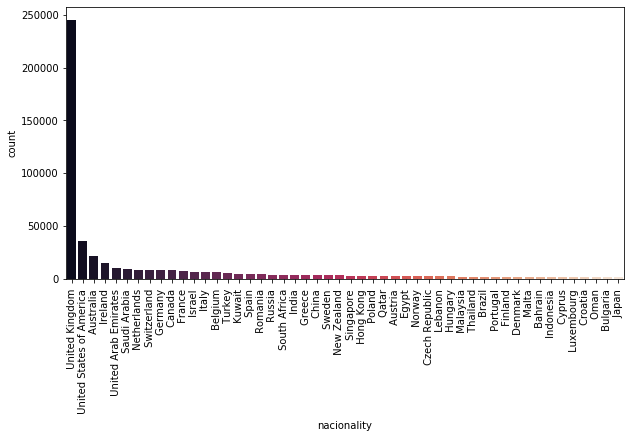

In [133]:
mas_comunes = contador_nacionalidades.most_common(50)
#print(mas_comunes)
#natio_counts_df = pd.DataFrame([mas_comunes]).T.reset_index()
natio_counts_df = pd.DataFrame(mas_comunes, columns=['nacionality', 'count'])
#natio_counts_df.columns = ['nacionality', 'count']
natio_counts_df = natio_counts_df.sort_values(by='count', ascending=False)

natio_counts_df.head()

plt.figure(figsize=(10, 5))
sns.barplot(x='nacionality', y='count', data=natio_counts_df, palette='rocket')
plt.xticks(rotation=90)
plt.show()

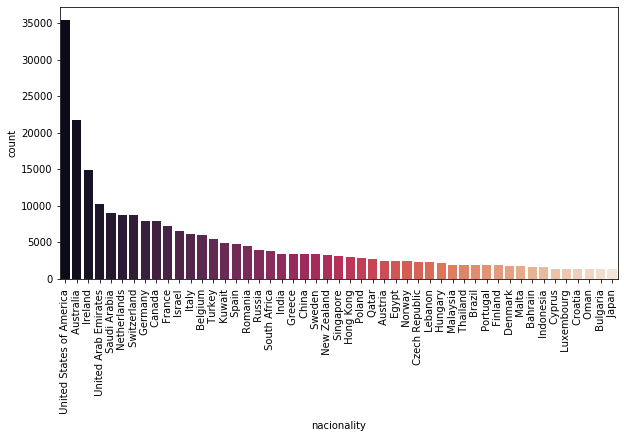

In [134]:
mas_comunes_noUK = mas_comunes
del(mas_comunes_noUK[0])
mas_comunes_noUK

natio_counts_df = pd.DataFrame(mas_comunes_noUK, columns=['nacionality', 'count'])
natio_counts_df = natio_counts_df.sort_values(by='count', ascending=False)

natio_counts_df.head()

plt.figure(figsize=(10, 5))
sns.barplot(x='nacionality', y='count', data=natio_counts_df, palette='rocket')
plt.xticks(rotation=90)
plt.show()


Los viajeros más que más visitan Europa son de `United Kingdom`, seguido por `USA`, `Australia`, `Irlanda` y `Emiratos Arabes`.

In [148]:
df = review_info_eu.copy()
df.columns = df.columns.str.replace('Total_Number_of_Reviews_Reviewer_Has_Given', 'given_reviews')


In [149]:
# anadir las columnas para manipular el dataframe
df.insert(0, 'temp_id', range(1, len(df)+1))
df.insert(1, 'user_id', [0 for i in range(len(df))])
df_copy = df.copy()
df_copy.head()

,temp_id,user_id,hotel_id,Reviewer_Nationality,Negative_Review,Positive_Review,Reviewer_Score,Review_Date,given_reviews
0,1,0,0,Russia,I am so angry that i made this post available...,Only the park outside of the hotel was beauti...,2.9,8/3/2017,7
1,2,0,0,Ireland,No Negative,No real complaints the hotel was great great ...,7.5,8/3/2017,7
2,3,0,0,Australia,Rooms are nice but for elderly a bit difficul...,Location was good and staff were ok It is cut...,7.1,7/31/2017,9
3,4,0,0,United Kingdom,My room was dirty and I was afraid to walk ba...,Great location in nice surroundings the bar a...,3.8,7/31/2017,1
4,5,0,0,New Zealand,You When I booked with your company on line y...,Amazing location and building Romantic setting,6.7,7/24/2017,3


In [150]:
df = df_copy.copy()
conta_usr = 1
for row in df.itertuples(index=True, name='Pandas'):
    #print(f"Index: {row.Index}, ID: {row.temp_id}, Name: {row.reviewer_nationality}, #Reviews: {row.given_reviews}")
    curr_row = row
    index = row.Index+1
    if index >= len(df): 
        break
    temp_df = df[index:]
    
    tmp = df.loc[row.Index, ['user_id']].values[0]
    print(f"user_id: {tmp}")
    if tmp == 0:
        df.loc[row.Index, ['user_id']] = conta_usr
        print(f"new user... {conta_usr}")
        conta_usr = conta_usr + 1
        
        conta_revs = 1
        print(f"analizando {row.Index}, ID: {row.temp_id}")
        for rowin in temp_df.itertuples(index=True, name='Pandas'):
            #print(f"\tIndex: {rowin.Index}, ID: {rowin.temp_id}, Name: {rowin.Reviewer_Nationality}, #Reviews: {rowin.given_reviews}")
            
            if row.Reviewer_Nationality == rowin.Reviewer_Nationality:
                #print(f"\t{row.reviewer_nationality} / {conta_revs}:")
                conta_revs = conta_revs + 1
                df.loc[rowin.Index, ['user_id']] = df.loc[row.Index, ['user_id']]

            if conta_revs >= row.given_reviews:
                #print("breaking...")
                break
        

user_id: 0
new user... 1
analizando 0, ID: 1
user_id: 0
new user... 2
analizando 1, ID: 2
user_id: 0
new user... 3
analizando 2, ID: 3
user_id: 0
new user... 4
analizando 3, ID: 4
user_id: 0
new user... 5
analizando 4, ID: 5
user_id: 0
new user... 6
analizando 5, ID: 6
user_id: 0
new user... 7
analizando 6, ID: 7
user_id: 7
user_id: 0
new user... 8
analizando 8, ID: 9
user_id: 0
new user... 9
analizando 9, ID: 10
user_id: 7
user_id: 0
new user... 10
analizando 11, ID: 12
user_id: 7
user_id: 0
new user... 11
analizando 13, ID: 14
user_id: 0
new user... 12
analizando 14, ID: 15
user_id: 11
user_id: 7
user_id: 2
user_id: 0
new user... 13
analizando 18, ID: 19
user_id: 3
user_id: 7
user_id: 10
user_id: 0
new user... 14
analizando 22, ID: 23
user_id: 2
user_id: 0
new user... 15
analizando 24, ID: 25
user_id: 0
new user... 16
analizando 25, ID: 26
user_id: 15
user_id: 10
user_id: 16
user_id: 0
new user... 17
analizando 29, ID: 30
user_id: 2
user_id: 0
new user... 18
analizando 31, ID: 32
use

In [153]:
#df.to_csv('reviews_with_user_id.csv')
print(df.sample(n=10))

        temp_id  user_id  hotel_id Reviewer_Nationality  \
1304       1305      273         2      United Kingdom    
219490   219491    37085       633      United Kingdom    
361932   361933    60236      1049      United Kingdom    
293859   293860    49353       871      United Kingdom    
254906   254907    42913       742               Egypt    
499417   499418    80272      1465      United Kingdom    
52899     52900     9253       148      United Kingdom    
72839     72840    12807       205      United Kingdom    
409365   409366    67298      1180               China    
442790   442791    72564      1271      United Kingdom    

                                          Negative_Review  \
1304                                             Nothing    
219490   There was no shower gel in our AM bottle Ther...   
361932   Christmas dinner was a flop I ordered braised...   
293859   It wasn t a bad experience but we thought tha...   
254906                                    Sta

In [157]:
num_unique_users = df['user_id'].nunique()
print("Number of different users:", num_unique_users)

Number of different users: 82992


In [158]:
df

,temp_id,user_id,hotel_id,Reviewer_Nationality,Negative_Review,Positive_Review,Reviewer_Score,Review_Date,given_reviews
0,1,1,0,Russia,I am so angry that i made this post available...,Only the park outside of the hotel was beauti...,2.9,8/3/2017,7
1,2,2,0,Ireland,No Negative,No real complaints the hotel was great great ...,7.5,8/3/2017,7
2,3,3,0,Australia,Rooms are nice but for elderly a bit difficul...,Location was good and staff were ok It is cut...,7.1,7/31/2017,9
3,4,4,0,United Kingdom,My room was dirty and I was afraid to walk ba...,Great location in nice surroundings the bar a...,3.8,7/31/2017,1
4,5,5,0,New Zealand,You When I booked with your company on line y...,Amazing location and building Romantic setting,6.7,7/24/2017,3
...,...,...,...,...,...,...,...,...,...
515733,515734,82819,1493,Kuwait,no trolly or staff to help you take the lugga...,location,7.0,8/30/2015,8
515734,515735,82363,1493,Estonia,The hotel looks like 3 but surely not 4,Breakfast was ok and we got earlier check in,5.8,8/22/2015,12
515735,515736,82895,1493,Egypt,The ac was useless It was a hot week in vienn...,No Positive,2.5,8/19/2015,3
515736,515737,81693,1493,Mexico,No Negative,The rooms are enormous and really comfortable...,8.8,8/17/2015,3



[Hotel Reviews](https://www.kaggle.com/datasets/datafiniti/hotel-reviews)